In [ ]:
import pandas as pd
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster
import unicodedata
import matplotlib.pyplot as plt

In [ ]:
from google.colab import files

uploaded = files.upload()

Saving Dataset .csv to Dataset .csv


In [ ]:
data=pd.read_csv('Dataset .csv')
data.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [ ]:
data['City'] = data['City'].apply(lambda x: unicodedata.normalize('NFKD', x).encode('ascii', 'ignore').decode('ascii'))
data['Address'] = data['Address'].apply(lambda x: unicodedata.normalize('NFKD', x).encode('ascii', 'ignore').decode('ascii'))
data['Locality'] = data['Locality'].apply(lambda x: unicodedata.normalize('NFKD', x).encode('ascii', 'ignore').decode('ascii'))
data['Locality Verbose'] = data['Locality Verbose'].apply(lambda x: unicodedata.normalize('NFKD', x).encode('ascii', 'ignore').decode('ascii'))

In [ ]:
gdf = gpd.GeoDataFrame(data, geometry=gpd.points_from_xy(data['Longitude'], data['Latitude']))

In [ ]:
map = folium.Map([gdf['Latitude'].mean(), gdf['Longitude'].mean()], zoom_start=12)

In [ ]:
marker_cluster = MarkerCluster().add_to(map)
for index, row in gdf.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(marker_cluster)
map

In [ ]:
grouped_restaurants = gdf.groupby('City')
for City, group in grouped_restaurants:
    print(f"Restaurants in {City}: {len(group)}")

Restaurants in Abu Dhabi: 20
Restaurants in Agra: 20
Restaurants in Ahmedabad: 21
Restaurants in Albany: 20
Restaurants in Allahabad: 20
Restaurants in Amritsar: 21
Restaurants in Ankara: 20
Restaurants in Armidale: 1
Restaurants in Athens: 20
Restaurants in Auckland: 20
Restaurants in Augusta: 20
Restaurants in Aurangabad: 20
Restaurants in Balingup: 1
Restaurants in Bandung: 1
Restaurants in Bangalore: 20
Restaurants in Beechworth: 1
Restaurants in Bhopal: 20
Restaurants in Bhubaneshwar: 21
Restaurants in Birmingham: 20
Restaurants in Bogor: 2
Restaurants in Boise: 20
Restaurants in Bras_lia: 20
Restaurants in Cape Town: 20
Restaurants in Cedar Rapids/Iowa City: 20
Restaurants in Chandigarh: 18
Restaurants in Chatham-Kent: 1
Restaurants in Chennai: 20
Restaurants in Clatskanie: 1
Restaurants in Cochrane: 1
Restaurants in Coimbatore: 20
Restaurants in Colombo: 20
Restaurants in Columbus: 20
Restaurants in Consort: 1
Restaurants in Dalton: 20
Restaurants in Davenport: 20
Restaurants in

Aggregate ratins of the restaurents in the various loactions

In [ ]:
avg_ratings = grouped_restaurants['Aggregate rating'].mean()
print(avg_ratings)

City
Abu Dhabi          4.300000
Agra               3.965000
Ahmedabad          4.161905
Albany             3.555000
Allahabad          3.395000
                     ...   
Weirton            3.900000
Wellington City    4.250000
Winchester Bay     3.200000
Yorkton            3.300000
stanbul            4.292857
Name: Aggregate rating, Length: 141, dtype: float64


Cusines that present in the various locations

In [ ]:
cuisine_counts = grouped_restaurants['Cuisines'].value_counts()
print(cuisine_counts)

City       Cuisines                          
Abu Dhabi  American                              2
           Indian                                2
           Italian, Pizza                        2
           American, Desserts                    1
           American, Mexican, Seafood            1
                                                ..
stanbul    Italian, World Cuisine                1
           Restaurant Cafe, Desserts             1
           Restaurant Cafe, Turkish, Desserts    1
           Turkish                               1
           World Cuisine, Patisserie, Cafe       1
Name: count, Length: 3024, dtype: int64


Price range of the restaurents in the various loactions

In [ ]:
price_range = grouped_restaurants['Price range'].value_counts()
print(price_range)

City            Price range
Abu Dhabi       4              10
                3               6
                2               4
Agra            2               6
                3               6
                               ..
Winchester Bay  2               1
Yorkton         2               1
stanbul         3               6
                2               5
                4               3
Name: count, Length: 349, dtype: int64


**Finding insights in the Dataset**

Restaurents distribution by cusines

<Figure size 1000x600 with 0 Axes>

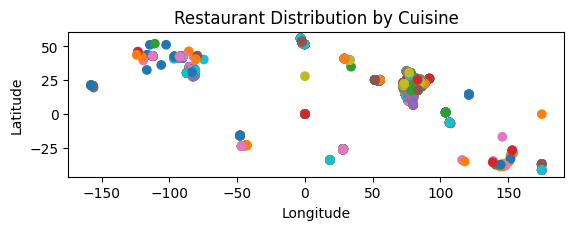

In [ ]:
%matplotlib inline
plt.figure(figsize=(10, 6))
gdf.plot(column='Cuisines')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Restaurant Distribution by Cuisine')
plt.show()


Restaurents in the various loactions


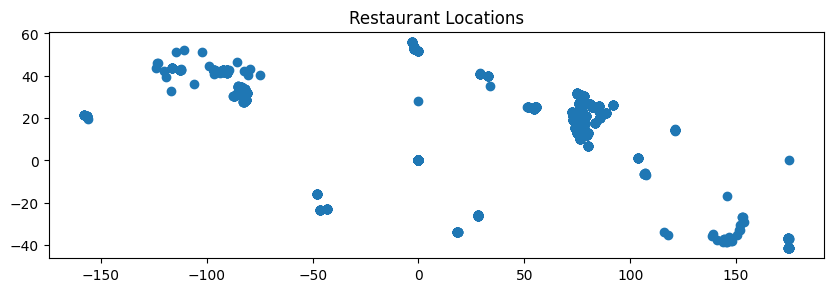

In [ ]:
gdf.plot(figsize=(10, 8))
plt.title('Restaurant Locations')
plt.show()